In [1]:
import numpy as np
from nptdms import TdmsFile
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import soundfile as sf

from pathlib import Path

In [2]:
import scipy
import pandas as pd
import librosa
import warnings
import os

In [3]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline
import src.file_dealer as file_dealer
from bat_detect.detector import models
from cfg import get_config
from pipeline import pipeline
from utils.utils import gen_empty_df, convert_df_ravenpro
from bat_detect.utils import wavfile
import bat_detect.utils.detector_utils as du
import bat_detect.detector.compute_features as feats
import bat_detect.detector.post_process as pp

In [4]:
cfg = get_config()
cfg['tmp_dir'] = Path('../output/tmp')
cfg['output_dir'] = Path('../output_dir/mic_array_test_20240906/')
cfg['run_model'] = True
cfg['should_csv'] = True
cfg['save'] = True

In [25]:
def run_pipeline_on_file(file, cfg):
    bd_preds = pd.DataFrame()

    if not cfg['output_dir'].is_dir():
        cfg['output_dir'].mkdir(parents=True, exist_ok=True)
    if not cfg['tmp_dir'].is_dir():
        cfg['tmp_dir'].mkdir(parents=True, exist_ok=True)


    if (cfg['run_model']):
        cfg["csv_filename"] = f"batdetect2_pipeline_{file.name.split('.')[0]}"
        filepath = (cfg['output_dir'] / f'{cfg["csv_filename"]}.csv')
        if not(filepath.is_file()):
            print(f"Generating detections for {file.name}")
            segmented_file_paths = batdetect2_pipeline.generate_segmented_paths([file], cfg)
            file_path_mappings = batdetect2_pipeline.initialize_mappings(segmented_file_paths, cfg)
            bd_preds = batdetect2_pipeline.run_models(file_path_mappings)
            if cfg['save']:
                batdetect2_pipeline._save_predictions(bd_preds, cfg['output_dir'], cfg)
            batdetect2_pipeline.delete_segments(segmented_file_paths)
        else:
            bd_preds = pd.read_csv(filepath)

    return bd_preds

In [6]:
def plot_audio_seg_spec(audio_features, spec_features):
    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    vmax = spec_features['vmax']
    vmin = spec_features['vmin']
    cmap = spec_features['cmap']
    nfft = spec_features['NFFT']

    plt.figure(figsize=(15, 5))
    plt.rcParams.update({'font.size': 18})
    plt.title(f"Spectrogram of {audio_features['plot_title']}", fontsize=24)
    plt.specgram(audio_seg, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')
    plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plot_xtype = 'float'
    if (duration > 60):
        plot_xtype = 'int'
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 11), 
               labels=np.round(np.linspace(start, start+duration, 11, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")
    plt.colorbar()
    plt.show()

def plot_audio_seg_signal(audio_features):
    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    plt.figure(figsize=(15, 5))
    plt.rcParams.update({'font.size': 18})
    plt.title(f"Signal of {audio_features['plot_title']}", fontsize=24)
    plt.plot(audio_seg)
    plot_xtype = 'float'
    plt.xlim(0, duration*fs)
    plt.xticks(ticks=np.linspace(0, audio_features['duration']*fs, 11), 
                labels=np.round(np.linspace(start, start+duration, 11, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Voltage (V)")
    plt.xlabel("Time (s)")
    plt.show()

def plot_audio_seg_fft(audio_features):
    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    plt.figure(figsize=(15, 5))
    plt.rcParams.update({'font.size': 18})
    plt.title(f"FFT of {audio_features['plot_title']}", fontsize=24)
    abs_sig = np.abs(scipy.fft.rfft(audio_seg, n=len(audio_seg)))
    abs_sig = abs_sig / len(abs_sig)
    plt.plot(20*np.log10(abs_sig/np.max(abs_sig)))
    plot_xtype = 'int'
    plt.xticks(ticks=np.linspace(0, len(abs_sig), 11), 
                labels=np.round(np.linspace(0, (fs/2), 11, dtype=plot_xtype), 2)/1e3, rotation=30)
    plt.ylabel("Voltage (dB)")
    plt.xlabel("Frequency (kHz)")
    plt.grid(which='both')
    plt.show()
    
FREQ_COLORS = {'LF':'cyan',
               'HF':'orange'}

def plot_colored_dets_over_audio(audio_features, spec_features, plot_dets):
    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    vmax = spec_features['vmax']
    vmin = spec_features['vmin']
    cmap = spec_features['cmap']
    nfft = spec_features['NFFT']

    plt.figure(figsize=(15, 5))
    plt.rcParams.update({'font.size': 24})
    plt.title(f"Spectrogram of {audio_features['plot_title']}", fontsize=24)
    plt.specgram(audio_seg, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')

    ax = plt.gca()
    for i, row in plot_dets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start)*(fs/2), row['low_freq']/(fs/2)), 
                        (row['end_time'] - row['start_time'])*(fs/2), (row['high_freq'] - row['low_freq'])/(fs/2), 
                        linewidth=2, edgecolor=FREQ_COLORS[row['KMEANS_CLASSES']], facecolor='none', alpha=0.8)
        ax.add_patch(rect)

    plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plot_xtype = 'float'
    if (duration > 60):
        plot_xtype = 'int'
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 11), 
               labels=np.round(np.linspace(start, start+duration, 11, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")
    plt.show()

In [7]:
def get_snr_from_band_limited_signal(snr_call_signal, snr_noise_signal): 

    signal_power_rms = np.sqrt(np.square(snr_call_signal).mean())
    noise_power_rms = np.sqrt(np.square(snr_noise_signal).mean())
    snr = abs(20 * np.log10(signal_power_rms / noise_power_rms))

    return snr


def bandpass_audio_signal(audio_seg, fs, low_freq_cutoff, high_freq_cutoff):
    nyq = fs // 2
    low_cutoff = (low_freq_cutoff) / nyq
    high_cutoff =  (high_freq_cutoff) / nyq
    b, a = scipy.signal.butter(4, [low_cutoff, high_cutoff], btype='band', analog=False)
    band_limited_audio_seg = scipy.signal.filtfilt(b, a, audio_seg)

    return band_limited_audio_seg

In [17]:
files_from_loc = sorted(list(Path('/Volumes/UBNA_017').glob(pattern='*.WAV')))
files_from_loc

[PosixPath('/Volumes/UBNA_017/20240907_022821.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_022900.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023000.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023100.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023200.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023300.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023400.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023500.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023600.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023700.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023800.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_023900.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_024000.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_024100.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_024200.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_024300.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_024400.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_024500.WAV'),
 PosixPath('/Volumes/UBNA_017/20240907_024600.

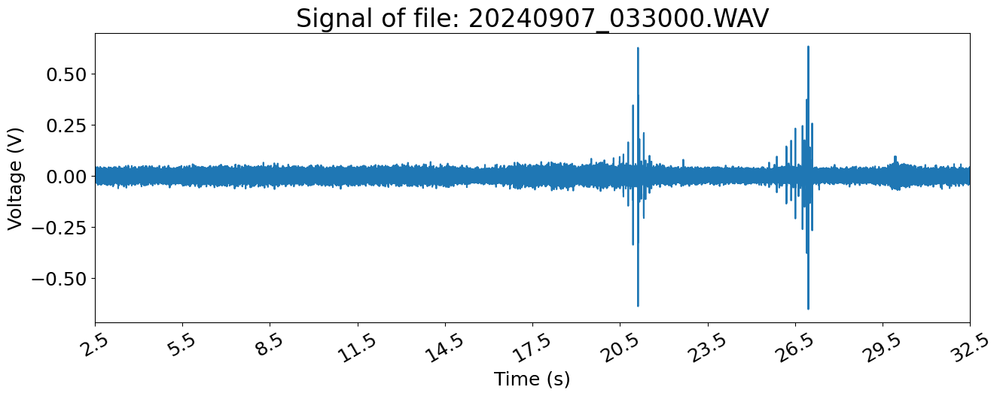

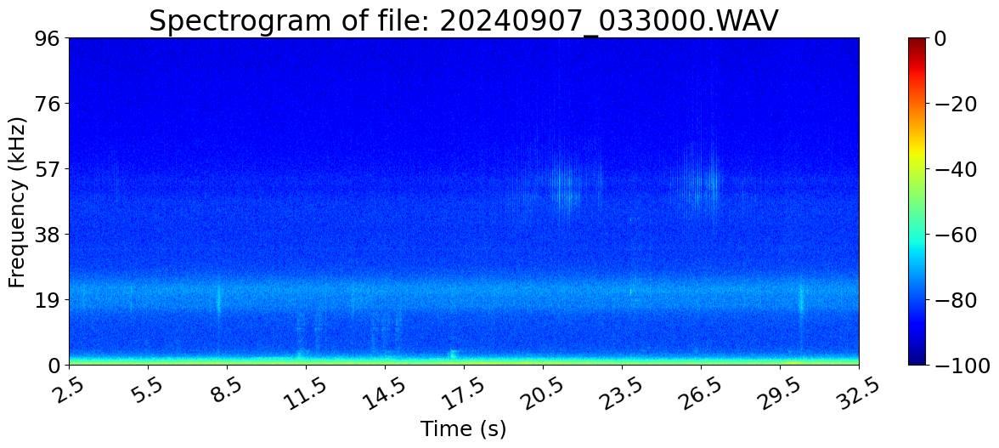

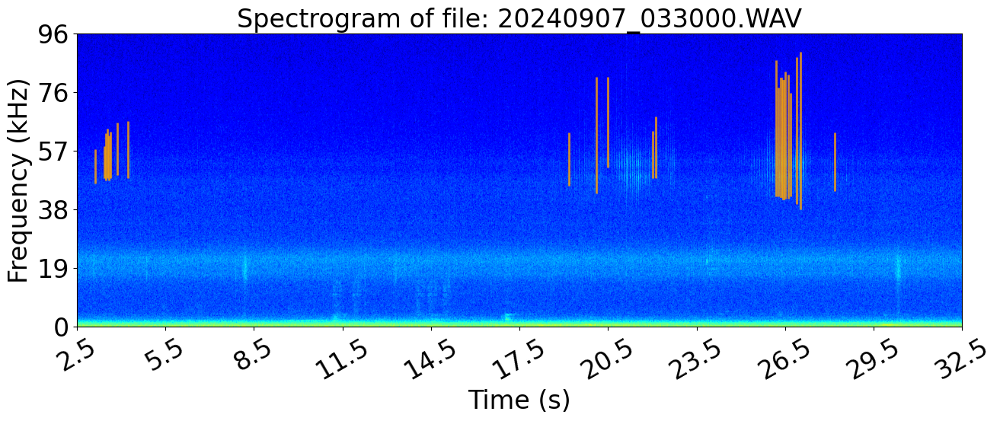

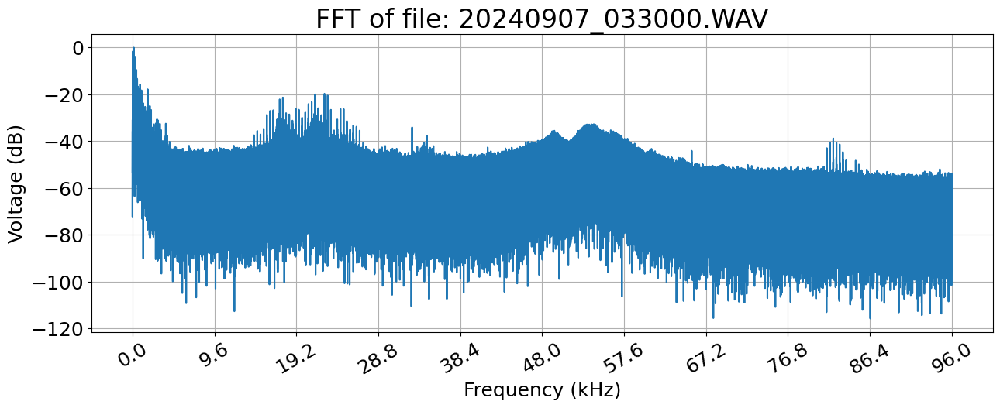

In [38]:
# for file in files_from_loc[56:]:
file = files_from_loc[62]
cfg['input_audio'] = Path(file)
dets = run_pipeline_on_file(file, cfg)

recorded_audio = sf.SoundFile(file)
fs = recorded_audio.samplerate
# for start in np.arange(0, (recorded_audio.frames/fs)-1, 60):
start = 2.5
recorded_audio.seek(int(fs*start))
duration = min(30, (recorded_audio.frames - recorded_audio.tell()) / fs)
audio_seg = recorded_audio.read(int(fs*duration))
vmax = 0
vmin = -100

audio_features = dict()
audio_features['file_path'] = Path(file)
audio_features['audio_seg'] = audio_seg
audio_features['sample_rate'] = fs
audio_features['start'] = start
audio_features['duration'] = duration

spec_features = dict()
spec_features['NFFT'] = 1024 # When segments are short, NFFT should also be small to best see calls (must always be > 128)
spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
spec_features['vmin'] = vmin
spec_features['vmax'] = vmax

audio_features['plot_title'] = f"file: {audio_features['file_path'].name}"
plot_audio_seg_signal(audio_features)
plot_audio_seg_spec(audio_features, spec_features)
plot_dets = dets.loc[(dets['start_time']>=start)&(dets['end_time']<=(start+duration))]
plot_dets = plot_dets.sort_values(by='start_time')
plot_dets.reset_index(drop=True, inplace=True)
plot_colored_dets_over_audio(audio_features, spec_features, plot_dets)
plot_audio_seg_fft(audio_features)

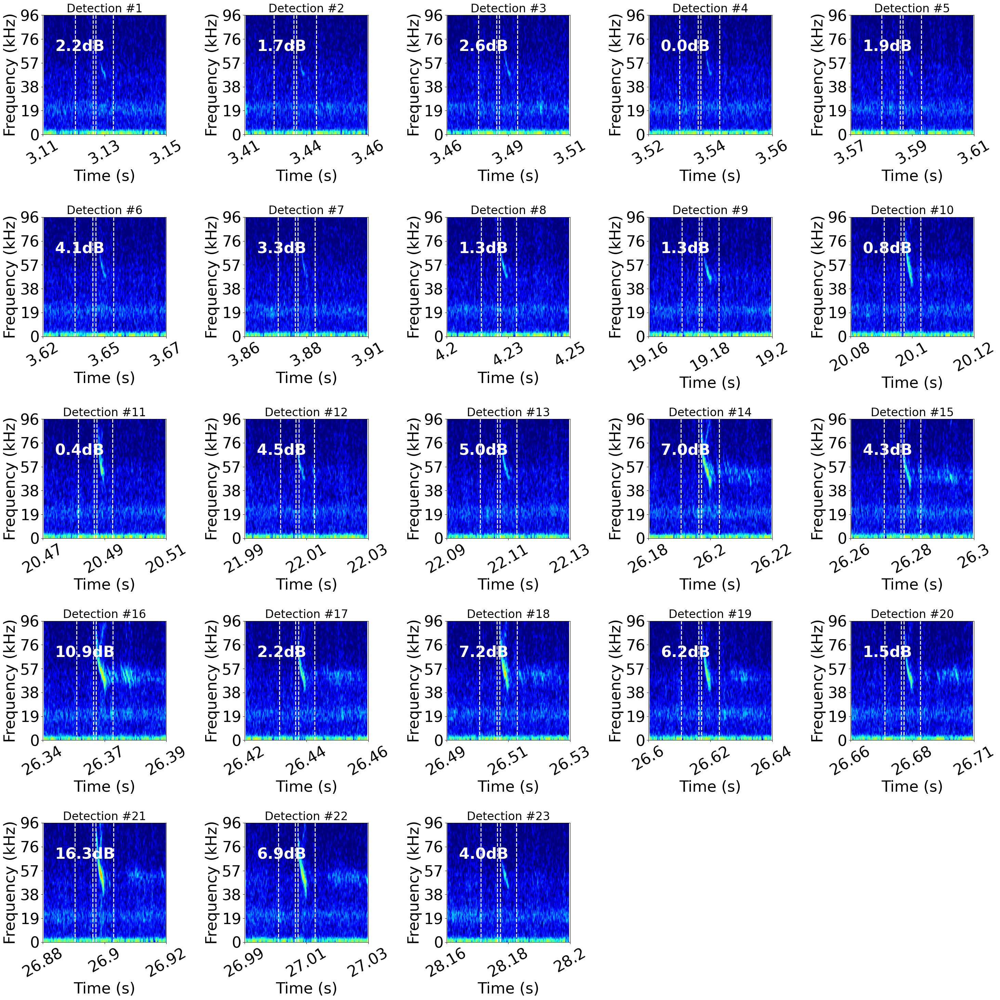

In [39]:
plt.figure(figsize=(6*np.ceil(len(plot_dets)**0.5), 6*np.ceil(len(plot_dets)**0.5)))
plt.rcParams.update({'font.size': 32})
for i, row in plot_dets.iterrows():
    start = row['start_time'] - 0.020
    call_dur = (row['end_time'] - row['start_time'])
    duration = call_dur + 0.040

    edge_pad = 0.001
    recorded_audio.seek(int(fs*(row['start_time']-edge_pad)))
    call_sig = recorded_audio.read(int(fs*(call_dur+(2*edge_pad))))
    # band_limited_call_sig = bandpass_audio_signal(call_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    recorded_audio.seek(int(fs*(row['start_time'] - call_dur - (4*edge_pad))))
    noise_sig = recorded_audio.read(int(fs*(call_dur+(2*edge_pad))))
    # band_limited_noise_sig = bandpass_audio_signal(noise_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    snr = get_snr_from_band_limited_signal(call_sig, noise_sig)

    recorded_audio.seek(int(fs*start))
    audio_seg = recorded_audio.read(int(fs*duration))
    lower_dB = -80
    upper_dB = 0
    vmin = lower_dB # hide anything below lower_dB dB
    vmax = upper_dB # hide anything above upper_dB dB
    cmap = 'jet'
    nfft = 132

    plt.subplot(int(np.ceil(len(plot_dets)**0.5)), int(np.ceil(len(plot_dets)**0.5)), i+1)
    plt.title(f'Detection #{i+1}', fontsize=24)
    plt.specgram(audio_seg, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')
    ax = plt.gca()
    plt.text(x=0.1, y=0.7, s=f'{round(row["SNR"],1)}dB', fontweight='bold', color='w', transform=ax.transAxes)
    plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plot_xtype = 'float'
    if (duration > 60):
        plot_xtype = 'int'
    start_time_of_call_sig = (0.02-edge_pad)
    end_time_of_call_sig = 0.02+(call_dur+edge_pad)
    start_time_of_noise_sig = (0.02-edge_pad) - (call_dur + (3*edge_pad))
    end_time_of_noise_sig = 0.02-(2*edge_pad)
    plt.axvline(x=start_time_of_call_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.axvline(x=end_time_of_call_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.axvline(x=start_time_of_noise_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.axvline(x=end_time_of_noise_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 3), 
               labels=np.round(np.linspace(start, start+duration, 3, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

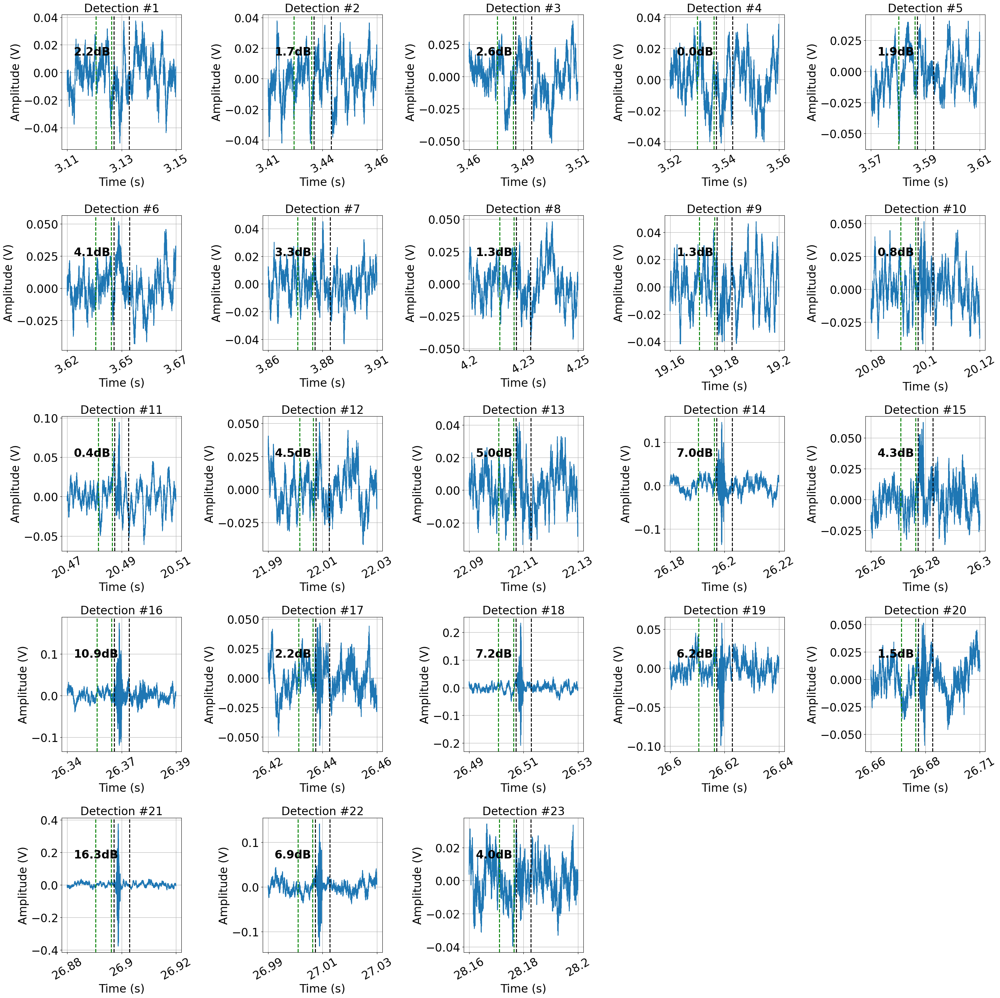

In [40]:
plt.figure(figsize=(6*np.ceil(len(plot_dets)**0.5), 6*np.ceil(len(plot_dets)**0.5)))
plt.rcParams.update({'font.size': 24})
for i, row in plot_dets.iterrows():
    start = row['start_time'] - 0.020
    call_dur = (row['end_time'] - row['start_time'])
    duration = call_dur + 0.040

    edge_pad = 0.001
    recorded_audio.seek(int(fs*(row['start_time']-edge_pad)))
    call_sig = recorded_audio.read(int(fs*(call_dur+(2*edge_pad))))
    # band_limited_call_sig = bandpass_audio_signal(call_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    recorded_audio.seek(int(fs*(row['start_time']-(call_dur+(4*edge_pad)))))
    noise_sig = recorded_audio.read(int(fs*(call_dur+(2*edge_pad))))
    # band_limited_noise_sig = bandpass_audio_signal(noise_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    snr = get_snr_from_band_limited_signal(call_sig, noise_sig)

    recorded_audio.seek(int(fs*start))
    audio_seg = recorded_audio.read(int(fs*duration))
    lower_dB = -58
    upper_dB = 0
    vmin = lower_dB # hide anything below lower_dB dB
    vmax = upper_dB # hide anything above upper_dB dB
    cmap = 'jet'
    nfft = 132

    plt.subplot(int(np.ceil(len(plot_dets)**0.5)), int(np.ceil(len(plot_dets)**0.5)), i+1)
    plt.title(f'Detection #{i+1}', fontsize=24)
    plt.plot(audio_seg)
    ax = plt.gca()
    plt.text(x=0.1, y=0.7, s=f'{round(row["SNR"],1)}dB', fontweight='bold', color='k', transform=ax.transAxes)
    plot_xtype = 'float'
    if (duration > 60):
        plot_xtype = 'int'
    plt.grid(which='both')
    start_time_of_call_sig = (0.02-edge_pad)
    end_time_of_call_sig = 0.02+(call_dur+edge_pad)
    start_time_of_noise_sig = (0.02-edge_pad) - (call_dur + (3*edge_pad))
    end_time_of_noise_sig = 0.02-(2*edge_pad)
    plt.axvline(x=start_time_of_call_sig*fs, linestyle='dashed', color='k', linewidth=2)
    plt.axvline(x=end_time_of_call_sig*fs, linestyle='dashed', color='k', linewidth=2)
    plt.axvline(x=start_time_of_noise_sig*fs, linestyle='dashed', color='g', linewidth=2)
    plt.axvline(x=end_time_of_noise_sig*fs, linestyle='dashed', color='g', linewidth=2)
    plt.xticks(ticks=np.linspace(0, duration*(fs), 3), 
               labels=np.round(np.linspace(start, start+duration, 3, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Amplitude (V)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

In [44]:
import dask.dataframe as dd

all_audiomoth_files = dd.read_csv('../output_dir/mic_array_test_20240906/batdetect2_pipeline_202409*.csv').compute()
all_audiomoth_files

,KMEANS_CLASSES,peak_frequency,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
0,LF,960.0,3.288464,10.9975,11.0054,28046.0,39229.0,Eptesicus serotinus,0.242,0.517,-1,Echolocation,192000.0,/Volumes/UBNA_017/20240907_022900.WAV
0,HF,960.0,1.1175,25.3175,25.3219,47812,63657,Pipistrellus pipistrellus,0.336,0.567,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_030800.WAV
1,HF,960.0,1.108556,31.3605,31.3648,48671,66272,Pipistrellus pipistrellus,0.425,0.536,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_030800.WAV
2,HF,960.0,1.660181,25.4935,25.498,45234,77442,Myotis alcathoe,0.293,0.55,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_030800.WAV
3,HF,960.0,2.899367,31.4175,31.4224,49531,61137,Pipistrellus pipistrellus,0.485,0.507,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_030800.WAV
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,HF,24960.0,3.58839,29.2385,29.2523,23750,34721,Eptesicus serotinus,0.419,0.672,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_035700.WAV
74,HF,960.0,0.124579,29.4285,29.4401,23750,35444,Eptesicus serotinus,0.474,0.714,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_035700.WAV
75,HF,960.0,0.747653,29.5905,29.6008,25468,36039,Eptesicus serotinus,0.377,0.641,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_035700.WAV
76,HF,960.0,0.45229,29.7135,29.7225,25468,35391,Eptesicus serotinus,0.379,0.597,-1,Echolocation,192000,/Volumes/UBNA_017/20240907_035700.WAV


Text(0.5, 0, 'SNR')

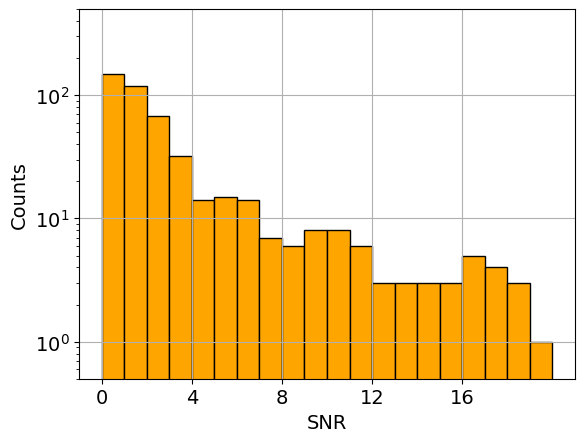

In [62]:
plt.rcParams.update({'font.size':14})
(all_audiomoth_files['SNR'].sort_values()).hist(bins=np.arange(0, 21, 1), facecolor='orange', edgecolor='k')
plt.yscale('log')
plt.xticks(np.arange(0, 20, 4))
plt.ylim(0.5, 500)
plt.ylabel('Counts')
plt.xlabel('SNR')

In [12]:
files_from_loc = sorted(list(Path('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/').glob(pattern='*.tdms')))
files_from_loc

[PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_1.tdms'),
 PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_2.tdms'),
 PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_3_in_balcony_start_073300.tdms'),
 PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_4_in_balcony_start_073500.tdms'),
 PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_5_in_balcony_start_074500.tdms'),
 PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_6_in_balcony_start_080000.tdms'),
 PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_7_in_balcony_start_081300.tdms'),
 PosixPath('/Users/adityakrishna/Downloads/mic_array_test_20240906_adityashome/recording_test_8_in_balcony_start_082000.tdms'),
 PosixPath('/Users/adity

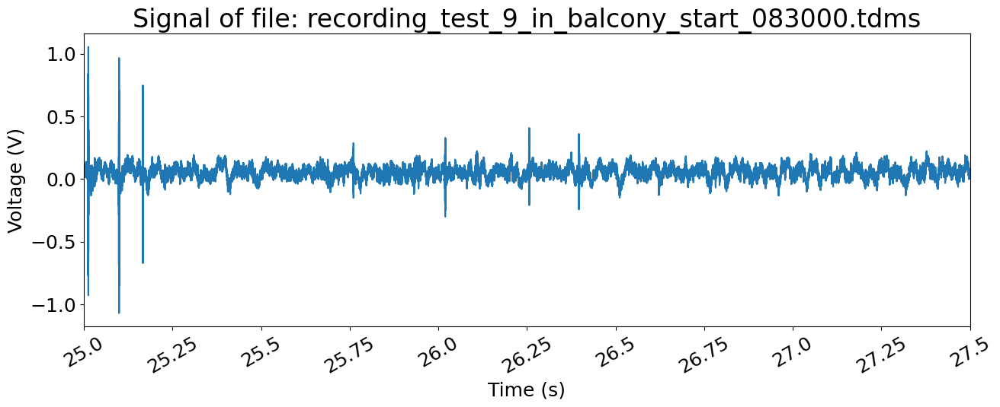

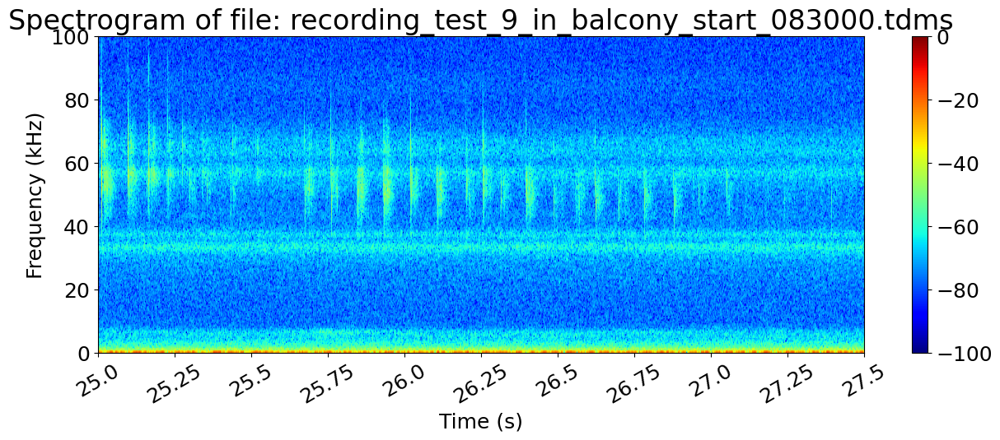

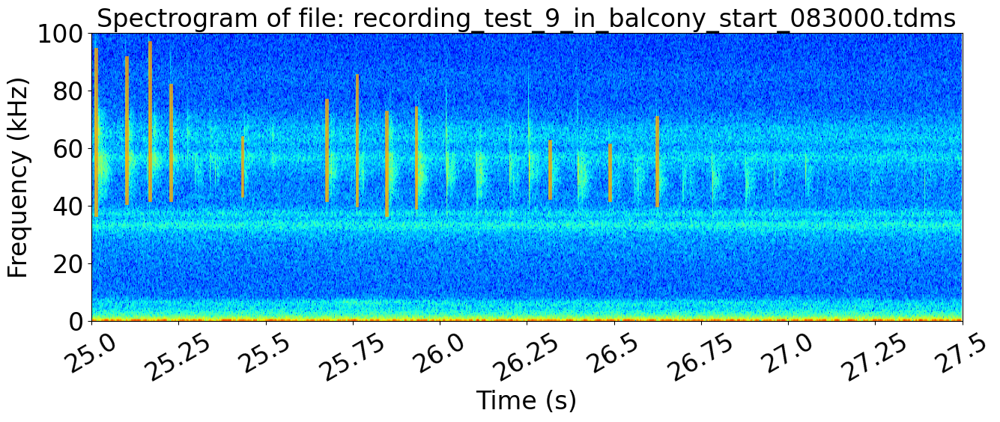

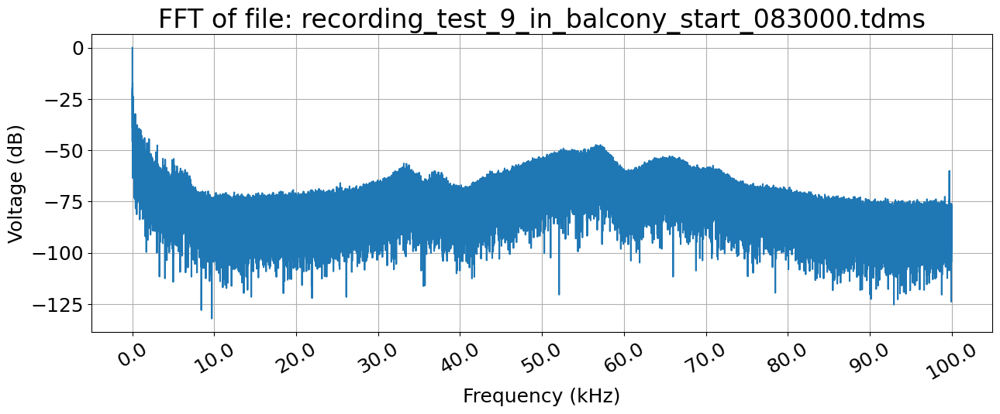

In [13]:
# for file in files_from_loc[7:9]:
file = files_from_loc[8]
tdms_file = TdmsFile.read(file)
group_name = tdms_file.groups()[0].name
group = tdms_file[group_name]
channel_name = group.channels()[0].name
channel = group[channel_name]
fs = 200000

write_file = Path(f'../../Downloads/{file.name}_sample.WAV')
sf.write(write_file, channel[:], int(fs))
cfg['input_audio'] = Path(write_file)
dets = run_pipeline_on_file(write_file, cfg)
Path(write_file).unlink()

duration = 2.5
# for start in np.arange(0, (len(channel[:])/fs), duration):
start = 25
audio_seg = channel[int(fs*start):int(fs*(start+duration))]
vmax = 0
vmin = -100
audio_features = dict()
audio_features['file_path'] = Path(file)
audio_features['audio_seg'] = audio_seg
audio_features['sample_rate'] = fs
audio_features['start'] = start
audio_features['duration'] = duration

spec_features = dict()
spec_features['NFFT'] = 512 # When segments are short, NFFT should also be small to best see calls (must always be > 128)
spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
spec_features['vmin'] = vmin
spec_features['vmax'] = vmax

audio_features['plot_title'] = f"file: {audio_features['file_path'].name}"
plot_audio_seg_signal(audio_features)
plot_audio_seg_spec(audio_features, spec_features)
plot_dets = dets.loc[(dets['start_time']>=start)&(dets['end_time']<=(start+duration))]
plot_dets = plot_dets.sort_values(by='start_time')
plot_dets.reset_index(drop=True, inplace=True)
plot_colored_dets_over_audio(audio_features, spec_features, plot_dets)
plot_audio_seg_fft(audio_features)

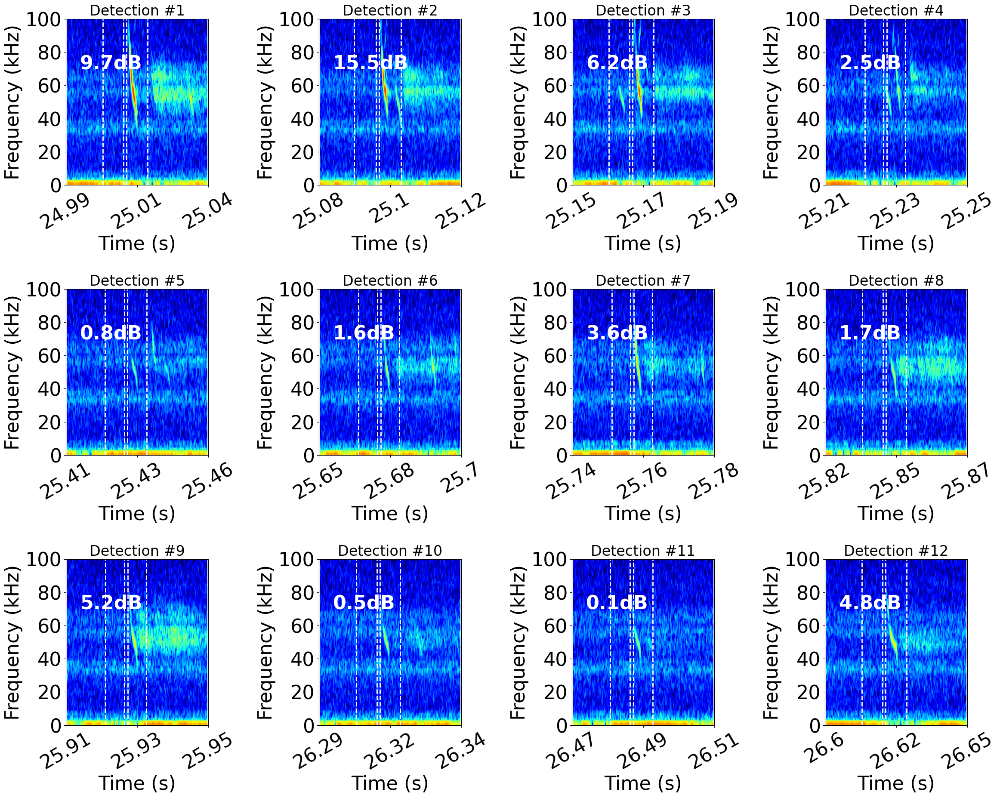

In [14]:
plt.figure(figsize=(6*np.ceil(len(plot_dets)**0.5), 6*np.ceil(len(plot_dets)**0.5)))
plt.rcParams.update({'font.size': 32})
for i, row in plot_dets.iterrows():
    start = row['start_time'] - 0.020
    call_dur = (row['end_time'] - row['start_time'])
    duration = call_dur + 0.040

    edge_pad = 0.001
    call_sig = channel[int(fs*(row['start_time']-edge_pad)):int(fs*(row['end_time']+edge_pad))]
    # band_limited_call_sig = bandpass_audio_signal(call_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    noise_sig = channel[int(fs*(row['start_time'] - call_dur - (4*edge_pad))):int(fs*(row['start_time']-(2*edge_pad)))]
    # band_limited_noise_sig = bandpass_audio_signal(noise_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    snr = get_snr_from_band_limited_signal(call_sig, noise_sig)

    audio_seg = channel[int(fs*start):int(fs*(start + duration))]
    lower_dB = -80
    upper_dB = 0
    vmin = lower_dB # hide anything below lower_dB dB
    vmax = upper_dB # hide anything above upper_dB dB
    cmap = 'jet'
    nfft = 132

    plt.subplot(int(np.ceil(len(plot_dets)**0.5)), int(np.ceil(len(plot_dets)**0.5)), i+1)
    plt.title(f'Detection #{i+1}', fontsize=24)
    plt.specgram(audio_seg, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')
    ax = plt.gca()
    plt.text(x=0.1, y=0.7, s=f'{round(row["SNR"],1)}dB', fontweight='bold', color='w', transform=ax.transAxes)
    plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plot_xtype = 'float'
    if (duration > 60):
        plot_xtype = 'int'
    start_time_of_call_sig = (0.02-edge_pad)
    end_time_of_call_sig = 0.02+(call_dur+edge_pad)
    start_time_of_noise_sig = (0.02-edge_pad) - (call_dur + (3*edge_pad))
    end_time_of_noise_sig = 0.02-(2*edge_pad)
    plt.axvline(x=start_time_of_call_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.axvline(x=end_time_of_call_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.axvline(x=start_time_of_noise_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.axvline(x=end_time_of_noise_sig*(fs/2), linestyle='dashed', color='w', linewidth=2)
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 3), 
               labels=np.round(np.linspace(start, start+duration, 3, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

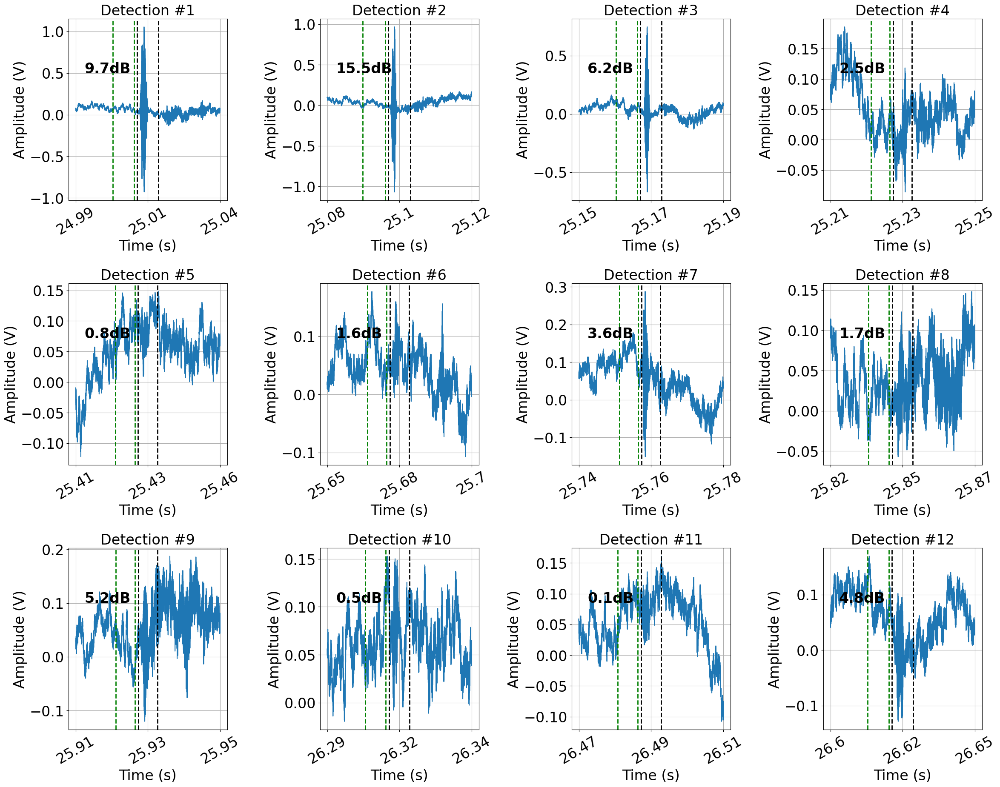

In [15]:
plt.figure(figsize=(6*np.ceil(len(plot_dets)**0.5), 6*np.ceil(len(plot_dets)**0.5)))
plt.rcParams.update({'font.size': 24})
for i, row in plot_dets.iterrows():
    start = row['start_time'] - 0.020
    call_dur = (row['end_time'] - row['start_time'])
    duration = call_dur + 0.040

    edge_pad = 0.001
    call_sig = channel[int(fs*(row['start_time']-edge_pad)):int(fs*(row['end_time']+edge_pad))]
    # band_limited_call_sig = bandpass_audio_signal(call_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    noise_sig = channel[int(fs*(row['start_time'] - call_dur - (4*edge_pad))):int(fs*(row['start_time']-(2*edge_pad)))]
    # band_limited_noise_sig = bandpass_audio_signal(noise_sig, fs, row['low_freq']-2000, row['high_freq']+2000)
    snr = get_snr_from_band_limited_signal(call_sig, noise_sig)

    audio_seg = channel[int(fs*start):int(fs*(start + duration))]
    lower_dB = -58
    upper_dB = 0
    vmin = lower_dB # hide anything below lower_dB dB
    vmax = upper_dB # hide anything above upper_dB dB
    cmap = 'jet'
    nfft = 132

    plt.subplot(int(np.ceil(len(plot_dets)**0.5)), int(np.ceil(len(plot_dets)**0.5)), i+1)
    plt.title(f'Detection #{i+1}', fontsize=24)
    plt.plot(audio_seg)
    ax = plt.gca()
    plt.text(x=0.1, y=0.7, s=f'{round(row["SNR"],1)}dB', fontweight='bold', color='k', transform=ax.transAxes)
    plot_xtype = 'float'
    if (duration > 60):
        plot_xtype = 'int'
    plt.grid(which='both')
    start_time_of_call_sig = (0.02-edge_pad)
    end_time_of_call_sig = 0.02+(call_dur+edge_pad)
    start_time_of_noise_sig = (0.02-edge_pad) - (call_dur + (3*edge_pad))
    end_time_of_noise_sig = 0.02-(2*edge_pad)
    plt.axvline(x=start_time_of_call_sig*fs, linestyle='dashed', color='k', linewidth=2)
    plt.axvline(x=end_time_of_call_sig*fs, linestyle='dashed', color='k', linewidth=2)
    plt.axvline(x=start_time_of_noise_sig*fs, linestyle='dashed', color='g', linewidth=2)
    plt.axvline(x=end_time_of_noise_sig*fs, linestyle='dashed', color='g', linewidth=2)
    plt.xticks(ticks=np.linspace(0, duration*(fs), 3), 
               labels=np.round(np.linspace(start, start+duration, 3, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Amplitude (V)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()